<a href="https://colab.research.google.com/github/T-Rolle387/Dog_Classification/blob/main/dog_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Unzip the uploaded data into Google Drive

In [ ]:
#!unzip "drive/MyDrive/Colab Notebooks/dog_classification/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/dog_classification"

# 🐕 End-to-end Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.8 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given a image of a dog.

When I am at the dog park and I take a photo of a dog, I want to know the dog breed.

## 2. Data

The data I am using is from Kaggle's dog breed identification competition.

It is available at the following link:

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Data information:
* Unstructured data (images) - Therefore, deep learning/transfer learning will be used.
* The model will be trained on 120 dog breeds(classes).
* The model will be trained on 10,000+ labeled images.
* The model will be tested on 10,000+ unlabeled images.

In [ ]:
# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

# Check for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


In [ ]:
# Getting the data ready-converting to tensors(numerical representations)

In [ ]:
# First access data and check out labels
import pandas as pd

labels_csv = pd.read_csv('drive/MyDrive/Colab Notebooks/dog_classification/labels.csv')

# Describe labels csv
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


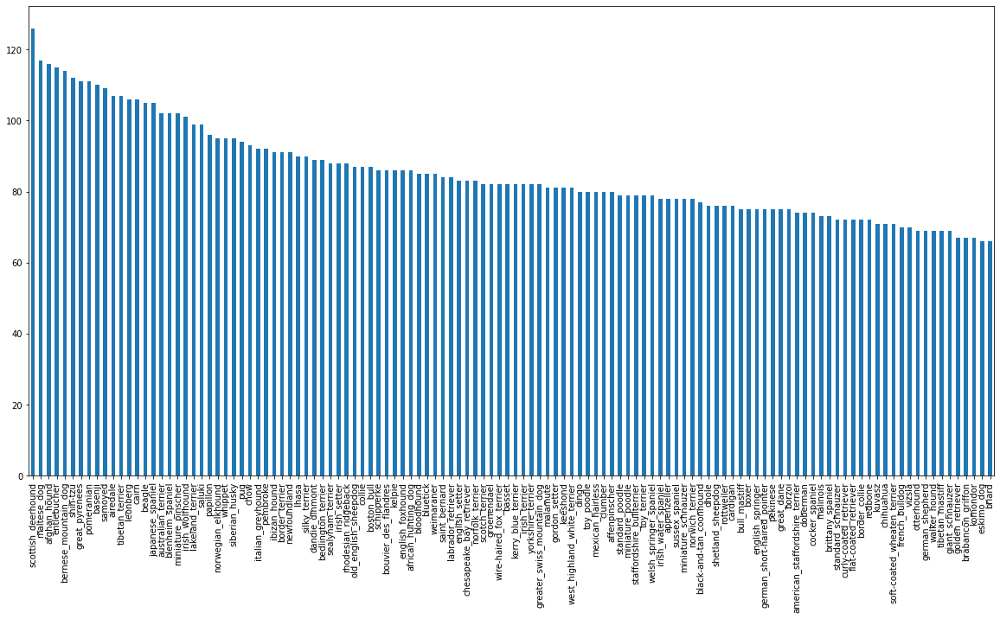

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [ ]:
# value counts
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [ ]:
# Median of col
labels_csv['breed'].value_counts().median()

82.0

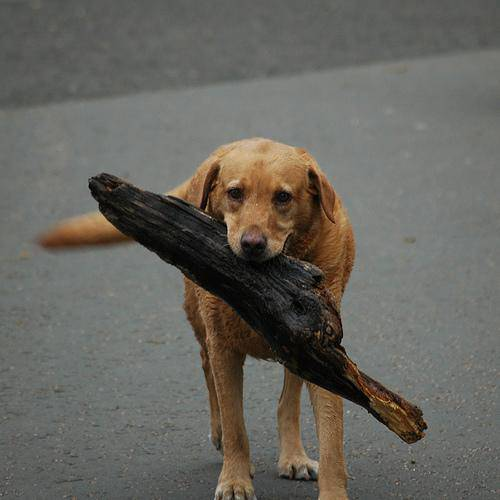

In [ ]:
# View an image
from IPython.display import Image
Image('drive/MyDrive/Colab Notebooks/dog_classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg')

In [ ]:
# Getting images and their labels
# Get a list of all image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ['drive/MyDrive/Colab Notebooks/dog_classification/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/dog_classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
#import os
# os.listdir('drive/MyDrive/Data/train)[:10]
#if len(os.listdir('drive/MyDrive/Data/train/')) == len(filenames):
  #print('Filenames match actual amount of files. Proceed.')
#else:
  #print('Filenames do not match actual amount of files. Check the target directory.')

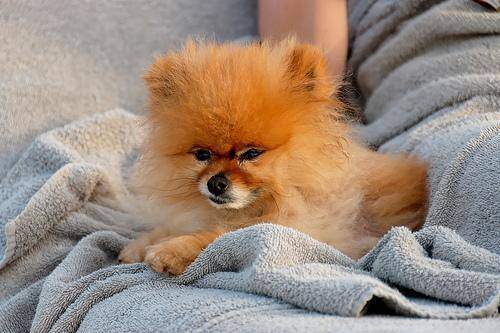

In [ ]:
# Double checking image access
Image(filenames[8000])

In [ ]:
import numpy as np
# Now that the training image filepaths are in a list, the next step is preparing labels
labels = labels_csv['breed']
np.array(labels)

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
    print('Number of labels matches number of filenames.')
else:
    print('Number of labels does not match number of filenames, check data directories.')

Number of labels matches number of filenames.


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
#boolean_labels[:2]

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a validation set
Validation set not present in Kaggle data.
One will be created below.

In [ ]:
# Set up X and y variables
X = filenames
y = boolean_labels

In [ ]:
# Because the dataset is so large, work with a portion of the data first.
# Start with around 1000

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step:500}

In [ ]:
# Split data into training and validation sets of total size NUM_IMAGES
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES], 
                                                  test_size=0.2, 
                                                  random_state=42)

In [ ]:
# Length of training and validation splits
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (turning images into Tensors)


In [ ]:
# The function below:
# 1. Takes an image filepath as input
# 2. Uses TensorFlow to read the file and save it to a variable, 'image'
# 3. Turn 'image' (a jpg) into Tensors
# 4. Normalize image (convert color channel values from 0-255 to 0-1)
# 5. Resize the 'image' to be a shape of (224, 224)
# 6. Return the modified 'image'

In [ ]:
# Define image size
IMG_SIZE = 224

# Function to preprocess images
def process_image(image_path, img_size=IMG_SIZE):
  """ 
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image to desired value(224, 224, 3)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning data into batches

In [ ]:
# Turn image into Tensor tuples '(image, label)'
def get_image_label(image_path, label):
  """
Takes an image file path name and the associated label, processes the image and
returns a tuple of (image, label).
"""
  image = process_image(image_path)
  return image, label

In [ ]:
# Turn image and label pairs(tuples of Tensors) into batches

In [ ]:
# Define batch size (don't go larger than 32)
BATCH_SIZE = 32

# Function used to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation
  data.
  Also accepts test data as input(no labels).
  """
  # If the data is a test data set, there are no labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid data set, it is not necessary to shuffle it
  elif valid_data:
      print('Creating validation data batches...')
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                 tf.constant(y))) # labels
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

  # Training batch
  else:
      print('Creating training data batches...')
      # Turn filepaths and labels into Tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

      # Shuffle pathnames and labels before mapping image processor function for speed
      data = data.shuffle(buffer_size=len(X))
      # Create (image, label) tuples (this also turns the image path into a preprocessed image)
      data = data.map(get_image_label)
      # Turn training data into batches
      data_batch = data.batch(BATCH_SIZE)
  return data_batch

                                        

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Visualization of data batches

In [ ]:
import matplotlib.pyplot as plt

# Function to view images in a batch
def show_25_imgs(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 immages)
  for i in range(25):
    # Create subplots (5 rows, 5 cols, index)
    ax = plt.subplot(5,5, (i+1))
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn grid lines off
    plt.axis('off')

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

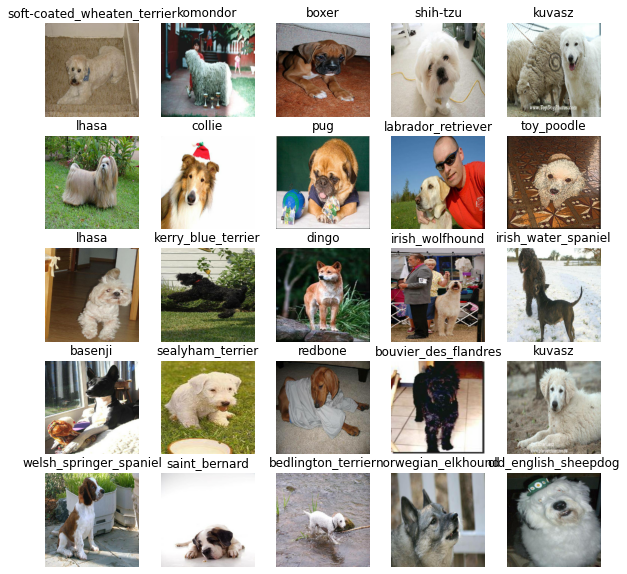

In [ ]:
# Visualize data in a training batch
show_25_imgs(train_images, train_labels)

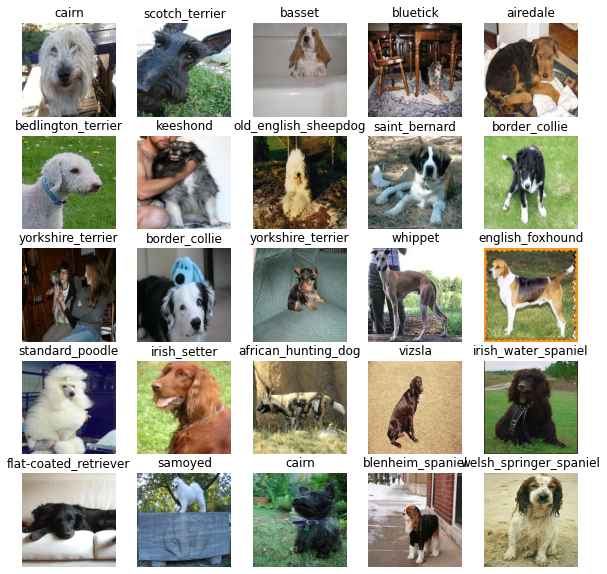

In [ ]:
# Visualize validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_imgs(val_images, val_labels)

## Building a model

Considerations:
* Input shape (in the form of Tensors)
* Output shape (image labels, in the form of Tensors)
* URL of intended model from TensorFlow Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

### Putting inputs, outputs and model together into a Keras sequential deep learning model

The function below:
* Accepts the input shape, output shape and the model as parameters
* Defines the layers in a Keras model in a sequential fashion
* Compiles the model (evaluation & improvement)
* Builds the model (Defines model input shape)
* Returns the model

In [ ]:
# Function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with: ', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Input Layer (Layer one)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation='softmax') # Output Layer (layer two)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
# Creating callbacks
# Callbacks : helper functions a model can use to save its progress, check its progress,
#   or stop training early if the model stops improving(to reduce overfitting)

In [ ]:
# First callback : TensorBoard which helps track the models progress
# Second callback : for early stopping to prevent the model from training too long

## TensorBoard Callback

To setup a TensorBoard callback three things need to be done
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the models 'fit()' function.
3. Visualize the model's training logs with '%tensorboard' magic function(after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Colab Notebooks/dog_classification/logs',
                        # allow for logs to get track when an experiment is ran
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training a model (on a subset of data)

The first model is only going to train on 1000 images to ensure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param{type:'slider', min:10, max:100, step:10}

Create a function that trains a model.

* Create a model using 'create_model()'
* Setup a TensorBoard callback using 'create_tensorboard_callback()'
* Call the 'fit()' function on the model passing it the training data,
validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks (helper functions)
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime a model is trained
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks created above
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()


Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 13s 263ms/step - loss: 4.5476 - accuracy: 0.1112 - val_loss: 3.4891 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 5s 185ms/step - loss: 1.6266 - accuracy: 0.6775 - val_loss: 2.2449 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 196ms/step - loss: 0.5822 - accuracy: 0.9312 - val_loss: 1.7379 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 5s 196ms/step - loss: 0.2552 - accuracy: 0.9900 - val_loss: 1.5381 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 5s 196ms/step - loss: 0.1468 - accuracy: 0.9975 - val_loss: 1.4581 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 5s 196ms/step - loss: 0.1006 - accuracy: 1.0000 - val_loss: 1.4172 - val_accuracy: 0.6500
Epoch 7/100
25/25 [============================

### Checking the TensorBoard logs

In [ ]:
# Use the tensorboard magic function (%tensorboard) will access the logs directory and visualize its contents
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/dog_classification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 212ms/step


array([[1.1862032e-03, 5.6902089e-05, 2.0798552e-04, ..., 3.4851435e-04,
        3.6096390e-05, 4.5777853e-03],
       [7.7480503e-04, 6.3070096e-05, 4.4658999e-03, ..., 3.3601053e-05,
        3.8296159e-04, 4.3461187e-05],
       [5.1104460e-05, 2.3332997e-05, 2.3041274e-04, ..., 7.8335324e-05,
        1.5786720e-05, 5.2306091e-04],
       ...,
       [8.0553355e-06, 6.8454428e-05, 4.5789911e-05, ..., 7.0119991e-06,
        6.4351124e-04, 9.1605027e-05],
       [1.5445602e-03, 9.8016179e-05, 2.9010907e-05, ..., 7.8786754e-05,
        3.3365410e-05, 1.0503249e-02],
       [6.9410988e-04, 6.2250228e-06, 5.5025192e-04, ..., 4.7095967e-03,
        1.5161614e-03, 1.5586813e-04]], dtype=float32)

In [ ]:
c#predictions.shape

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f'Max value (probability of predictio):{np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label:{unique_breeds[np.argmax(predictions[index])]}')

[2.1548818e-05 3.9684724e-05 3.1584674e-05 5.0040162e-06 1.3076653e-03
 3.6547303e-06 2.3646264e-05 7.1471144e-04 1.4637624e-03 1.8708386e-02
 8.2109345e-06 5.3974481e-06 4.5306806e-05 2.5020870e-03 6.2015629e-04
 7.4106117e-04 1.7141633e-06 8.9754642e-05 3.7423259e-05 6.5190681e-05
 8.2589977e-06 2.8747064e-04 4.1111172e-05 1.5161531e-05 2.2949143e-03
 2.2848581e-05 2.8276481e-05 2.3981213e-05 9.6576769e-05 2.7739590e-05
 6.8570002e-06 2.1856051e-04 2.1082711e-05 6.8988547e-06 8.5194115e-06
 1.1625370e-05 5.9116475e-05 4.9526963e-05 3.0920615e-05 2.7401203e-01
 4.7206166e-05 8.2002134e-06 8.7294989e-04 3.9785823e-07 8.1031678e-05
 1.1860834e-05 1.1887123e-04 7.1149261e-05 2.7337787e-06 1.1092841e-04
 1.9394502e-05 3.7647311e-05 4.5824308e-05 1.4699594e-03 4.5195234e-06
 3.8036378e-05 2.6966713e-05 1.7917115e-05 1.6354517e-05 4.0761511e-06
 9.4914722e-06 1.8203392e-04 2.3699822e-06 1.4301044e-05 3.1616648e-05
 2.1486414e-05 1.6708489e-05 9.9618774e-05 7.1963783e-05 8.0817554e-06
 1.639

In [ ]:
unique_breeds[113]

'walker_hound'

Goal: Complete the above at scale and produce an image of the dog the prediction is being made on.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'brittany_spaniel'

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Validation data is in batch form. To make predictions on the validation images
# it will need to be unbatched. Then the predictions need to be
# compared to the prediction labels (truth labels).

In [ ]:
# Function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Above illustrates code to get: prediction labels, validation labels(truth labels) and validation images

### Create a function for better visualization

The function below will:
* Take in an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the
target image on a single plot.

In [ ]:
def plot_preds(prediction_probabilities, labels, images, n=1):
  """
  View the prediction ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color depending on if the prediction is right
  if pred_label == true_label:
    color = '#15B01A'
  else:
    color = '#FF0000'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f} {}'.format(pred_label, 
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)


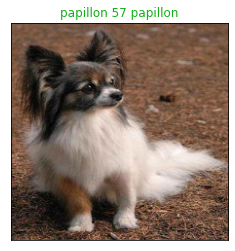

In [ ]:
plot_preds(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
           n=73)

### Function to view model's top 10 predictions

The function below will:
* Take as parameters a prediction probabilities array, a ground truth array,
and an integer
* Find the predicted label using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indices
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color='xkcd:sky blue')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('lightgreen')
  else:
    pass

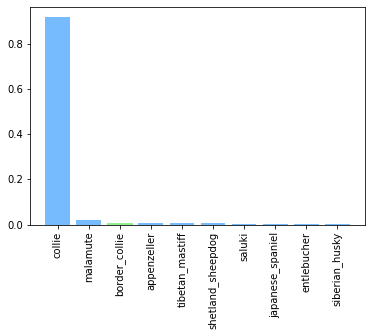

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

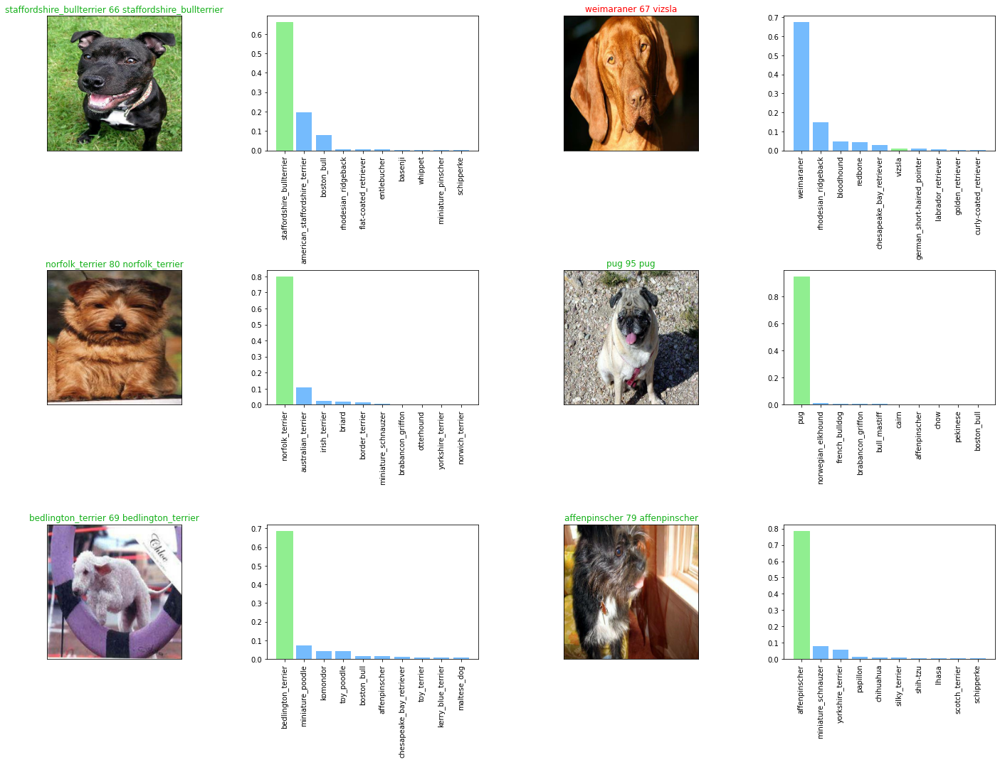

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 50
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_preds(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Text(0.5, 1.0, 'Confusion Matrix for Dog Classification')

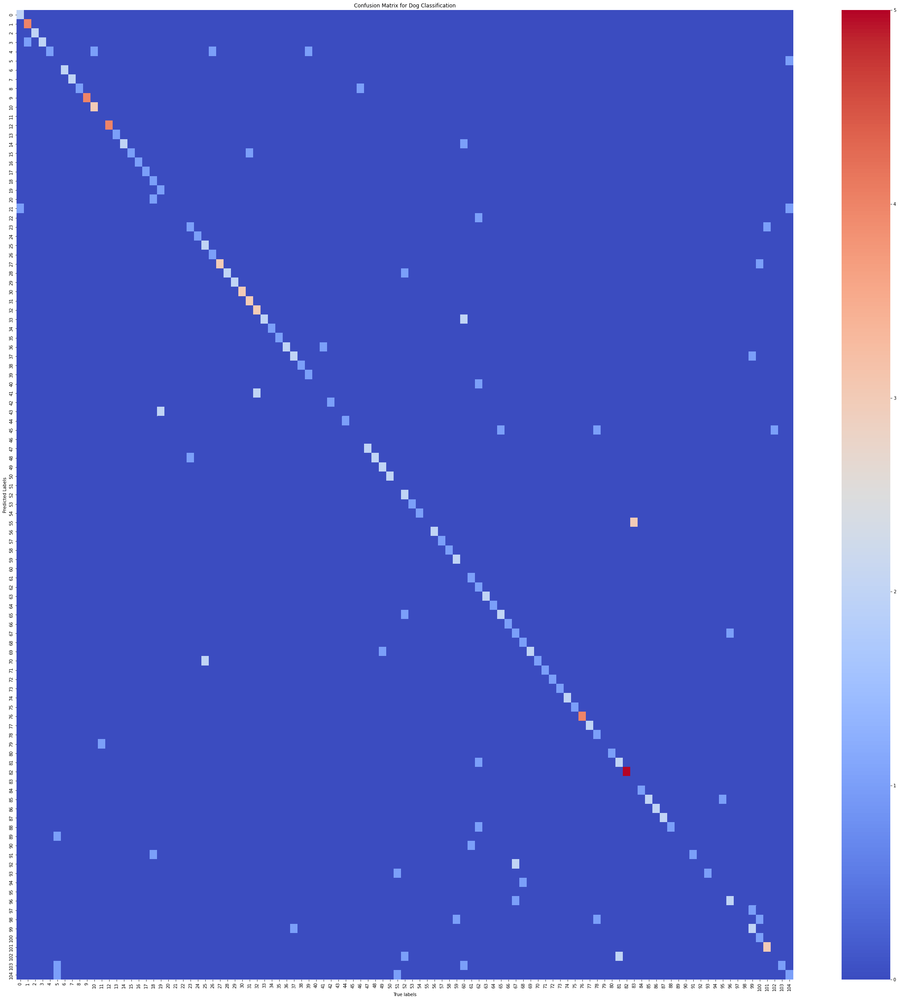

In [ ]:
# code for plotting a confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_preds = np.array([get_pred_label(p) for p in predictions]) # get the predicted labels

conf_matrix = confusion_matrix(val_labels, y_preds)

plt.figure(figsize=(40, 41))
sns.heatmap(conf_matrix, cmap='coolwarm')

plt.ylabel('Predicted Labels')
plt.xlabel('True labels')

# plt.xticks(ticks=np.arange(120), labels=unique_breeds)  # plot the breed name on axix
# plt.yticks(ticks=np.arange(120), labels=unique_breeds, rotation='horizontal')

plt.title('Confusion Matrix for Dog Classification')

#plt.savefig('drive/MyDrive/Colab Notebooks/dog_classification/conf_mat_without_labels.png');

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join('/content/drive/MyDrive/Colab Notebooks/dog_classification/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save model format
  print(f'Saving model to: {model_path}')
  model.save(model_path)
  return model_path

In [ ]:
# Load model for re-use
# The function below takes a model path and uses the 'tf.keras.models.load_model()'
# function to load it into the notebook
# Bc component of model is from TensorFlowHub (hub.KerasLayer) - pass this
# as a param to the custom_objects parameter.

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Colab Notebooks/dog_classification/models/20220315-22391647383952-1000-images-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Colab Notebooks/dog_classification/models/20220315-22391647383952-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_model_1000_img = load_model('drive/MyDrive/Colab Notebooks/dog_classification/models/20220309-20511646859104-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/dog_classification/models/20220309-20511646859104-1000-images-mobilenetv2-Adam.h5


## Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for the full data
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create callbacks for full model
full_model_tensorboard = create_tensorboard_callback()
# No validations set when training full model; therefore, unable to monitor 
# validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [ ]:
# Running the cell below will take appx 30 min for the first epoch - GPU being 
# used has to load all of the images into memory

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1205s 4s/step - loss: 1.3516 - accuracy: 0.6676
Epoch 2/100
320/320 [==============================] - 51s 160ms/step - loss: 0.4053 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 53s 164ms/step - loss: 0.2381 - accuracy: 0.9324
Epoch 4/100
320/320 [==============================] - 55s 172ms/step - loss: 0.1542 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 56s 175ms/step - loss: 0.1066 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0770 - accuracy: 0.9876
Epoch 7/100
320/320 [==============================] - 54s 169ms/step - loss: 0.0582 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 58s 180ms/step - loss: 0.0452 - accuracy: 0.9955
Epoch 9/100
320/320 [==============================] - 58s 180ms/step - loss: 0.0375 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 57s 176ms

In [ ]:
# Save full model
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Colab Notebooks/dog_classification/models/20220310-17111646932261-full-image-set-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Colab Notebooks/dog_classification/models/20220310-17111646932261-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in full model
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/dog_classification/models/20220310-17111646932261-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/dog_classification/models/20220310-17111646932261-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test data set

The following steps must be followed to make predictions on the test data:
* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and set the test_data parameter to True(because the data does not have labels)
* Make a predictions array by passing the test batches to the predict() method called on the model.

In [ ]:
# Format the test data to match the training data the model has been trained on
# Use 'create_data_batches()' to convert the the data into Tensor batches

In [ ]:
# Load test image filenames
test_path = 'drive/MyDrive/Colab Notebooks/dog_classification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/dog_classification/test/e46db7bcb804584eed8821ad4e132fd1.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/dfe02d52ca281aaca6215a42fee6245c.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/e7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/e40a39dd88f04b29ab3cb3a986503f8f.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/e4ba350279796ff15c3a634037a6f88e.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/deaef21699dae3945a79dcb820b2a980.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/test/de9a61a532241cff14e732f43b646d9a.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling 'predict()' on the full model and passing it the test data will take a long time to run(~ 1hour).
It will process ~10,000+ images and get the model to find patterns in those images and generate predictions based on what 
it has learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 241s 731ms/step


In [ ]:
# Save predictions as a NumPy array to csv file
#np.savetxt('drive/MyDrive/Colab Notebooks/dog_classification/test-preds/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions
test_predictions = np.loadtxt('drive/MyDrive/Colab Notebooks/dog_classification/test-preds/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[2.31458446e-11, 1.03689601e-09, 1.97017194e-10, ...,
        4.37508618e-07, 2.73377318e-05, 4.06602252e-10],
       [6.98205085e-08, 1.44943779e-09, 6.85742504e-11, ...,
        1.81145238e-10, 4.74964845e-10, 9.03182595e-08],
       [8.31817809e-11, 2.01553593e-10, 3.31463801e-10, ...,
        1.71146131e-09, 2.25275035e-05, 9.39424996e-11],
       ...,
       [2.44400712e-06, 5.89476304e-06, 6.50805421e-04, ...,
        1.05145864e-05, 1.07758455e-11, 1.70599965e-10],
       [1.49396866e-13, 1.01956852e-08, 6.62782156e-12, ...,
        2.12083556e-04, 1.43365133e-08, 3.02513858e-09],
       [1.98966973e-05, 9.96956078e-06, 2.12706681e-07, ...,
        3.01510653e-07, 2.06303795e-07, 1.92573850e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions

Below I will place the model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To place the data in this format I will execute the steps below:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data(the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV.

In [ ]:
#['id'] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
## Appends the test image ID's to to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e46db7bcb804584eed8821ad4e132fd1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dfe02d52ca281aaca6215a42fee6245c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7afb35b8252782013a6700e28e327fa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e40a39dd88f04b29ab3cb3a986503f8f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1dd78810048dc387573f2ec50e4bb16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e46db7bcb804584eed8821ad4e132fd1,2.314584e-11,1.036896e-09,1.970172e-10,7.624848e-08,4.638310e-07,3.256034e-08,2.485383e-05,5.485165e-05,9.881385e-04,...,1.026355e-09,5.646244e-10,2.258037e-05,9.916036e-01,2.686485e-08,2.253973e-07,6.366602e-10,4.375086e-07,2.733773e-05,4.066023e-10
1,dfe02d52ca281aaca6215a42fee6245c,6.982051e-08,1.449438e-09,6.857425e-11,8.145141e-09,1.408092e-08,1.343942e-12,3.442587e-07,9.961735e-10,5.111220e-07,...,6.440619e-06,6.732886e-08,1.636007e-08,3.430781e-09,2.171879e-09,1.019159e-09,1.093725e-07,1.811452e-10,4.749648e-10,9.031826e-08
2,e7afb35b8252782013a6700e28e327fa,8.318178e-11,2.015536e-10,3.314638e-10,2.220705e-09,2.023895e-10,1.563666e-08,2.616532e-11,4.232745e-11,4.445418e-10,...,4.807746e-09,3.897135e-07,3.051929e-09,9.788156e-10,5.049377e-08,2.021686e-09,6.937923e-08,1.711461e-09,2.252750e-05,9.394250e-11
3,e40a39dd88f04b29ab3cb3a986503f8f,9.882920e-10,1.955190e-05,9.087142e-09,1.106444e-07,1.427856e-08,1.532843e-07,2.055615e-08,1.724309e-07,2.336358e-06,...,1.399532e-06,1.928746e-07,5.293775e-05,6.298254e-04,2.752603e-06,2.724967e-11,7.008862e-12,6.243644e-07,1.461942e-08,1.311925e-08
4,e1dd78810048dc387573f2ec50e4bb16,7.460211e-05,8.561641e-08,1.103209e-08,2.188504e-10,4.146865e-08,8.745716e-09,1.386017e-06,1.113736e-08,4.883212e-07,...,9.614772e-04,1.181171e-06,1.153012e-06,6.414730e-09,3.833145e-08,9.937208e-12,3.393807e-06,7.195639e-08,3.047319e-06,1.376159e-05


In [ ]:
# Save predictions dataframe to CSV for submission
preds_df.to_csv("drive/MyDrive/Colab Notebooks/dog_classification/full_model_predictions_df_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images I will take the following steps:
* Get the filepaths of my personal images 
* Turn the filepaths into data batches using 'create_data_batches()'. Because my 
images won't have labels I will set the test_data parameter to True.
* Pass the custom image data batch to the model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to custom images.

In [ ]:
custom_path = 'drive/MyDrive/Colab Notebooks/dog_classification/my-dog-images/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path) if '.ipynb_checkpoints' not in fname]         

In [ ]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/dog_classification/my-dog-images/Sherman.jpg',
 'drive/MyDrive/Colab Notebooks/dog_classification/my-dog-images/Mia.jpg']

In [ ]:
# View my dog - He really likes Starbucks
#from IPython.display import Image
#Image('drive/MyDrive/Colab Notebooks/dog_classification/my-dog-images/Sherman.jpg')

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['staffordshire_bullterrier', 'kuvasz']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

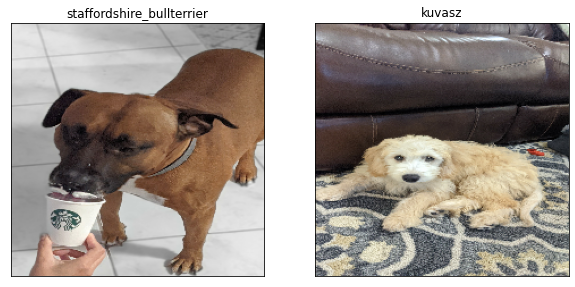

In [ ]:
 # Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)